# APLICAÇÃO E COMPARAÇÃO DE FILTROS EM DIGITAIS NEONATAIS

### Dependências Necessárias

In [ ]:
!uv pip install -q --system numba-cuda==0.4.0

###Importações Necessárias

In [ ]:
import cv2
import cupy as cp
import numpy as np
from numba import config
config.CUDA_ENABLE_PYNVJITLINK = 1  # Configuração necessária para evitar erros de PTX incompatível.
from numba import cuda
from skimage.metrics import structural_similarity as ssim
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from tabulate import tabulate

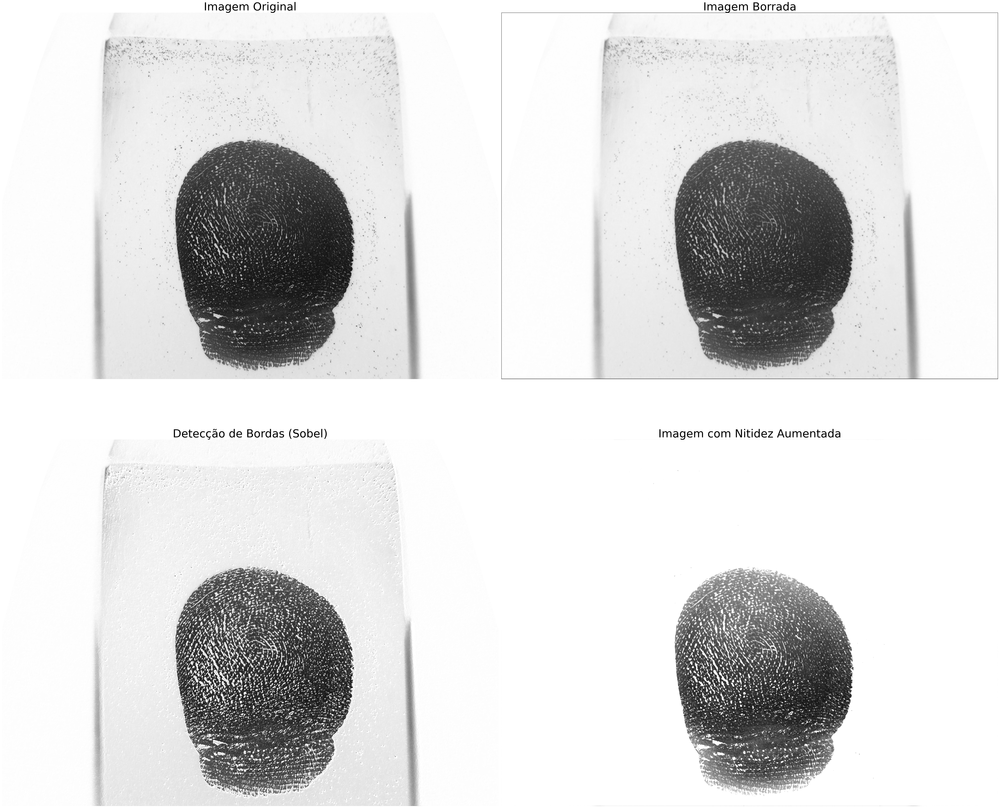

+-----------------------------------+--------------------+--------------------+
|              Filtro               |        SNR         |        SSIM        |
+-----------------------------------+--------------------+--------------------+
|   Filtro Gaussiano (Borramento)   | 23.90641212463379  | 0.9160885239218068 |
| Filtro Sobel (Detecção de Bordas) | 18.341224670410156 | 0.7749338690737008 |
|         Filtro de Nitidez         | 15.875519752502441 | 0.8813687071541743 |
+-----------------------------------+--------------------+--------------------+


In [5]:
# Definição dos kernels
LAPLACIAN_KERNEL = cp.array([[ 0,  1,  0],
                             [ 1, -4,  1],
                             [ 0,  1,  0]], dtype=cp.float32)

GAUSSIAN_KERNEL = cp.array([[1, 4, 6, 4, 1],
                                [4, 16, 24, 16, 4],
                                [6, 24, 36, 24, 6],
                                [4, 16, 24, 16, 4],
                                [1, 4, 6, 4, 1]], dtype=cp.float32) / 256

SHARPEN_KERNEL_SOFT = cp.array([[ 0, -0.25,  0],
                                [-0.25,  2, -0.25],
                                [ 0, -0.25,  0]], dtype=cp.float32)

SOBEL_X_KERNEL = cp.array([[-1, 0, 1],
                           [-2, 0, 2],
                           [-1, 0, 1]], dtype=cp.float32)

SOBEL_Y_KERNEL = cp.array([[-1, -2, -1],
                           [ 0,  0,  0],
                           [ 1,  2,  1]], dtype=cp.float32)

# Kernel CUDA para aplicar a convolução na GPU
@cuda.jit
def apply_filter_cuda(image, result, kernel):
    x, y = cuda.grid(2)
    height, width = image.shape
    if 1 <= x < width - 1 and 1 <= y < height - 1:
        value = 0.0
        for i in range(kernel.shape[0]):
            for j in range(kernel.shape[1]):
                value += image[y + i - 1, x + j - 1] * kernel[i, j]
        result[y, x] = min(max(value, 0), 255)

# Aplicação de filtros na GPU com metodologia PCAM
def apply_filter(image, kernel):
    height, width = image.shape
    d_image = cp.asarray(image, dtype=cp.float32)
    d_result = cp.zeros_like(d_image)
    d_kernel = cp.asarray(kernel, dtype=cp.float32)

    # Particionamento: Dividir a imagem em blocos de 16x16 pixels
    threads_per_block = (16, 16)
    blocks_per_grid_x = (width + threads_per_block[0] - 1) // threads_per_block[0]
    blocks_per_grid_y = (height + threads_per_block[1] - 1) // threads_per_block[1]

    # Communicação: Transferir dados para a GPU
    image_numba = cuda.to_device(d_image.get())
    result_numba = cuda.to_device(d_result.get())
    kernel_numba = cuda.to_device(d_kernel.get())

    # Mapeamento: Atribuir blocos de pixels a threads da GPU
    apply_filter_cuda[(blocks_per_grid_x, blocks_per_grid_y), threads_per_block](image_numba, result_numba, kernel_numba)

    # Transferir o resultado de volta para a CPU
    d_result = cp.asarray(result_numba.copy_to_host())
    return d_result

# Aplicação do filtro Gaussiano (borramento)
def apply_gaussian_blur(image):
    return apply_filter(image, GAUSSIAN_KERNEL)

# Aplicação do filtro Laplaciano (detecção de bordas)
def apply_laplacian(image):
    return apply_filter(image, LAPLACIAN_KERNEL)

# Aplicação do filtro de nitidez com kernel menos agressivo e borramento prévio
def apply_sharpen_soft(image):
    blurred = apply_gaussian_blur(image)
    sharpened = apply_filter(blurred, SHARPEN_KERNEL_SOFT)
    return cp.clip(image + sharpened, 0, 255)

# Aplicação do filtro Sobel combinado com a imagem original
def apply_sobel_combined(image):
    sobel_x = apply_filter(image, SOBEL_X_KERNEL)
    sobel_y = apply_filter(image, SOBEL_Y_KERNEL)
    edges = cp.sqrt(sobel_x**2 + sobel_y**2)  # Magnitude do gradiente
    combined = cp.clip(image + edges, 0, 255)  # Combina original + bordas
    return combined

# Cálculo das métricas
def calculate_snr_gpu(original, processed):
    original = cp.asarray(original, dtype=cp.float32)
    processed = cp.asarray(processed, dtype=cp.float32)
    signal_power = cp.mean(original ** 2)
    noise_power = cp.mean((original - processed) ** 2)
    return 10 * cp.log10(signal_power / noise_power) if noise_power != 0 else cp.inf

def evaluate_filters_gpu(original, filtered):
    snr_value = calculate_snr_gpu(original, filtered)
    ssim_value = ssim(cp.asnumpy(original), cp.asnumpy(filtered), data_range=255)
    return {"SNR": snr_value.get(), "SSIM": ssim_value}

# Printar as imagens
def display_results(original, blurred, edges, sharpened, metrics):

    plt.figure(figsize=(50, 45))

    # Original e Borrada
    plt.subplot(2, 2, 1)
    plt.imshow(original, cmap='gray')
    plt.title("Imagem Original", fontsize=40)
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(blurred, cmap='gray')
    plt.title("Imagem Borrada", fontsize=40)
    plt.axis('off')

    # Detecção de Bordas e Nitidez
    plt.subplot(2, 2, 3)
    plt.imshow(edges, cmap='gray')
    plt.title("Detecção de Bordas (Sobel)", fontsize=40)
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(sharpened, cmap='gray')
    plt.title("Imagem com Nitidez Aumentada", fontsize=40)
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Exibir as métricas em uma tabela
    table = [
        ["Filtro Gaussiano (Borramento)", metrics["blurred"]["SNR"], metrics["blurred"]["SSIM"]],
        ["Filtro Sobel (Detecção de Bordas)", metrics["edges"]["SNR"], metrics["edges"]["SSIM"]],
        ["Filtro de Nitidez", metrics["sharpened"]["SNR"], metrics["sharpened"]["SSIM"]]
    ]
    headers = ["Filtro", "SNR", "SSIM"]
    print(tabulate(table, headers, tablefmt="pretty"))

# Carregar e processar imagem
def process_image(image_path):
    # Carregar imagem em escala de cinza
    image_cpu = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image_gpu = cp.asarray(image_cpu, dtype=cp.float32)  # Garantir que a imagem seja float32

    # Aplicar filtros
    blurred_image = apply_gaussian_blur(image_gpu)  # Borramento
    edges_image = apply_sobel_combined(image_gpu)   # Detecção de bordas (Sobel combinado)
    sharpened_image = apply_sharpen_soft(image_gpu)  # Nitidez

    # Calcular métricas
    metrics = {
        "blurred": evaluate_filters_gpu(image_gpu, blurred_image),
        "edges": evaluate_filters_gpu(image_gpu, edges_image),
        "sharpened": evaluate_filters_gpu(image_gpu, sharpened_image)
    }

    # Exibir resultados
    display_results(cp.asnumpy(image_gpu), cp.asnumpy(blurred_image), cp.asnumpy(edges_image), cp.asnumpy(sharpened_image), metrics)

# Chamar função principal
process_image('frame_1.png')